In [2]:
# import huggingface_hub
# huggingface_hub.login()

In [30]:
import os
import glob
import random
from typing import cast

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.auto import tqdm

import torch
import warnings

from notebooks_config import setup_logging, CustomLogger

warnings.simplefilter(action='ignore', category=FutureWarning)
print(f"PyTorch: {torch.__version__}")
print(f"Device: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'}")

PyTorch: 2.9.1+cu128
Device: NVIDIA GeForce RTX 5050 Laptop GPU


In [33]:
logger = setup_logging(full_color=True, include_function=False)
logger = cast(CustomLogger, logger)  # Type hinting
logger.success("Logging configuration test completed.")


[2025-12-10 17:55:41]
SUCCESS: Logging configured successfully ✅

[2025-12-10 17:55:41]
SUCCESS: Logging configuration test completed.


# Explore Data

In [13]:
PATH_DATA = './kaggle/input/csiro-biomass'
PATH_TRAIN_CSV = os.path.join(PATH_DATA, 'train.csv')
PATH_TEST_CSV = os.path.join(PATH_DATA, 'test.csv')
PATH_TRAIN_IMG = os.path.join(PATH_DATA, 'train')
PATH_TEST_IMG = os.path.join(PATH_DATA, 'test')

df = pd.read_csv(PATH_TRAIN_CSV)
print(f"Dataset size: {df.shape}")
display(df.head())

Dataset size: (1785, 9)


,sample_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,target_name,target
0,ID1011485656__Dry_Clover_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Clover_g,0.0000
1,ID1011485656__Dry_Dead_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Dead_g,31.9984
2,ID1011485656__Dry_Green_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Green_g,16.2751
3,ID1011485656__Dry_Total_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Total_g,48.2735
4,ID1011485656__GDM_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,GDM_g,16.2750


In [6]:
TARGET_COLS = [c for c in df.columns if c not in ['image_id', 'Image']]
print(f"Target columns: {TARGET_COLS}")
print(f"Number of targets: {len(TARGET_COLS)}")

Target columns: ['sample_id', 'image_path', 'Sampling_Date', 'State', 'Species', 'Pre_GSHH_NDVI', 'Height_Ave_cm', 'target_name', 'target']
Number of targets: 9


In [8]:
df.head()

,sample_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,target_name,target
0,ID1011485656__Dry_Clover_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Clover_g,0.0000
1,ID1011485656__Dry_Dead_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Dead_g,31.9984
2,ID1011485656__Dry_Green_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Green_g,16.2751
3,ID1011485656__Dry_Total_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Total_g,48.2735
4,ID1011485656__GDM_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,GDM_g,16.2750


What is this about?

- `sample_id` — Unique identifier for each training *sample* (image). The logic is the following: `sample_id = image_id + '_' + target_name`. For example, if image_id is `abc123` and target_name is `biomass`, then sample_id will be `abc123_biomass`. This means that **each image will have multiple rows in the training data**, one for each target_name.
- `image_path` — Relative path to the training image (e.g., `images/ID1098771283.jpg`).
- `Sampling_Date` — Date of sample collection. In `YYYY-MM-DD` format.
- `State` — Australian state where sample was collected.
- `Species` — Pasture species present, ordered by biomass (underscore-separated).
- `Pre_GSHH_NDVI` — Normalized Difference Vegetation Index (GreenSeeker) reading.
- `Height_Ave_cm` — Average pasture height measured by falling plate (cm).
- `target_name` — Biomass component name for this row (Dry_Green_g, Dry_Dead_g, Dry_Clover_g, GDM_g, or Dry_Total_g).
- `target` — Ground-truth biomass value (grams) corresponding to target_name for this image.

A little bit detailed look:

- `Species` — Think of it as a categorical variable that indicates the types of grass species present in the image. Each species is separated by an underscore, and the order indicates the dominance of each species in terms of biomass. For example, if `Species` is `Ryegrass_Clover`, it means that *Ryegrass* is the most dominant species in terms of biomass, followed by *Clover*.
- `Pre_GSHH_NDVI` — This is a numerical value that represents the health and vigor of the vegetation in the image. NDVI values typically range from -1 to 1, where higher values indicate healthier and more vigorous vegetation. This index is calculated using the reflectance of near-infrared and red light from the vegetation.
- `Height_Ave_cm` — This is a straightforward numerical measurement that indicates the average height of the pasture in centimeters. It is measured using a falling plate method, which involves placing a plate on the pasture and measuring how high it stands above the ground. This measurement can provide insights into the growth stage and density of the pasture, which can be important factors in biomass estimation.
- `target_name` - This column indicates the specific type of biomass measurement being reported in the `target` column for that row. The different types of biomass measurements include:
  - `Dry_Green_g`: The weight of the green (living) portion of the biomass after it has been dried.
  - `Dry_Dead_g`: The weight of the dead (non-living) portion of the biomass after it has been dried.
  - `Dry_Clover_g`: The weight of the clover portion of the biomass after it has been dried.
  - `GDM_g`: This could refer to a general dry matter measurement, or a specific type of biomass measurement, possibly "Green Dry Matter" or another relevant term used in the context of pasture biomass.

I have noticed that there is a correlation in `target_name` groups.

My hypothesis is the following. For each image, the following relationships hold:

- `Dry_Total_g` = `Dry_Green_g` + `Dry_Dead_g` + `Dry_Clover_g`
- `GDM_g` = `Dry_Clover_g` + `Dry_Green_g`

Let's check it by code

In [34]:
tolerance = 0.001

# Extract image_id from sample_id (format: image_id__target_name)
df['image_id'] = df['sample_id'].str.split('__').str[0]

# Pivot the data to get all target_names for each image_id
pivot_df = df.pivot_table(
    index='image_id',
    columns='target_name',
    values='target',
    aggfunc='first'
)

print("Checking relationships with tolerance:", tolerance)

# Check: Dry_Total_g = Dry_Green_g + Dry_Dead_g + Dry_Clover_g
print("\n1. Checking: Dry_Total_g = Dry_Green_g + Dry_Dead_g + Dry_Clover_g")
total_check = pivot_df[['Dry_Total_g', 'Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g']].dropna()
total_calc = total_check['Dry_Green_g'] + total_check['Dry_Dead_g'] + total_check['Dry_Clover_g']
total_diff = (total_check['Dry_Total_g'] - total_calc).abs()
total_valid = (total_diff <= tolerance).sum()
print(f"Valid entries: {total_valid} out of {len(total_check)}")
print(f"Max difference: {total_diff.max():.6f}")
print(f"Mean difference: {total_diff.mean():.6f}")
if total_valid == len(total_check):
    logger.success("Relationship CONFIRMED!")
else:
    logger.error(f"Failed entries: {len(total_check) - total_valid}")
    failed_mask = total_diff > tolerance
    print("\nFailed cases:")
    for idx in total_check[failed_mask].index:
        calc = total_check.loc[idx, 'Dry_Green_g'] + total_check.loc[idx, 'Dry_Dead_g']
        actual = total_check.loc[idx, 'Dry_Total_g']
        diff = abs(actual - calc)
        print(f"{idx}: calculated={calc:.4f}, actual={actual:.4f}, diff={diff:.6f}")

# Check: GDM_g = Dry_Clover_g + Dry_Green_g
print("\n2. Checking: GDM_g = Dry_Clover_g + Dry_Green_g")
gdm_check = pivot_df[['GDM_g', 'Dry_Clover_g', 'Dry_Green_g']].dropna()
gdm_calc = gdm_check['Dry_Clover_g'] + gdm_check['Dry_Green_g']
gdm_diff = (gdm_check['GDM_g'] - gdm_calc).abs()
gdm_valid = (gdm_diff <= tolerance).sum()
print(f"Valid entries: {gdm_valid} out of {len(gdm_check)}")
print(f"Max difference: {gdm_diff.max():.6f}")
print(f"Mean difference: {gdm_diff.mean():.6f}")
if gdm_valid == len(gdm_check):
    logger.success("Relationship CONFIRMED!")
else:
    logger.error(f"Failed entries: {len(gdm_check) - gdm_valid}")
    failed_mask = gdm_diff > tolerance
    print("\nFailed cases:")
    for idx in gdm_check[failed_mask].index:
        calc = gdm_check.loc[idx, 'Dry_Clover_g'] + gdm_check.loc[idx, 'Dry_Green_g']
        actual = gdm_check.loc[idx, 'GDM_g']
        diff = abs(actual - calc)
        print(f"{idx}: calculated={calc:.4f}, actual={actual:.4f}, diff={diff:.6f}")

Checking relationships with tolerance: 0.001

1. Checking: Dry_Total_g = Dry_Green_g + Dry_Dead_g + Dry_Clover_g
Valid entries: 356 out of 357
Max difference: 0.308800
Mean difference: 0.000878

[2025-12-10 17:55:46]
ERROR: Failed entries: 1

Failed cases:
ID2014192906: calculated=10.0000, actual=10.1912, diff=0.191200

2. Checking: GDM_g = Dry_Clover_g + Dry_Green_g
Valid entries: 357 out of 357
Max difference: 0.000100
Mean difference: 0.000015

[2025-12-10 17:55:46]
SUCCESS: Relationship CONFIRMED!


As we see, my hypothesis is confirmed! Even the fact, that we faced 1 failed entry in `Dry_Total_g = Dry_Green_g + Dry_Dead_g + Dry_Clover_g` check, it can be ignored as a data inconsistency issue.  

In [15]:
df_test = pd.read_csv(PATH_TEST_CSV)
df_test

,sample_id,image_path,target_name
0,ID1001187975__Dry_Clover_g,test/ID1001187975.jpg,Dry_Clover_g
1,ID1001187975__Dry_Dead_g,test/ID1001187975.jpg,Dry_Dead_g
2,ID1001187975__Dry_Green_g,test/ID1001187975.jpg,Dry_Green_g
3,ID1001187975__Dry_Total_g,test/ID1001187975.jpg,Dry_Total_g
4,ID1001187975__GDM_g,test/ID1001187975.jpg,GDM_g


In test set we have only 1 image, but 5 rows to submit, since we need to predict all 5 target_names for that image.

1


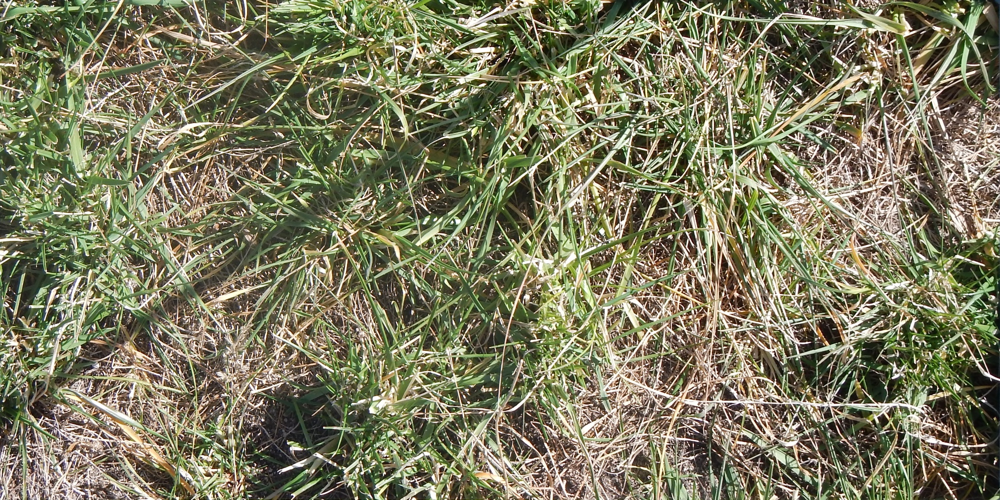

In [24]:
test_img_files = glob.glob(os.path.join(PATH_TEST_IMG, '*.jpg'))
print(len(test_img_files))

# show image
test_img = Image.open(test_img_files[0])
test_img

## Plot target distribution

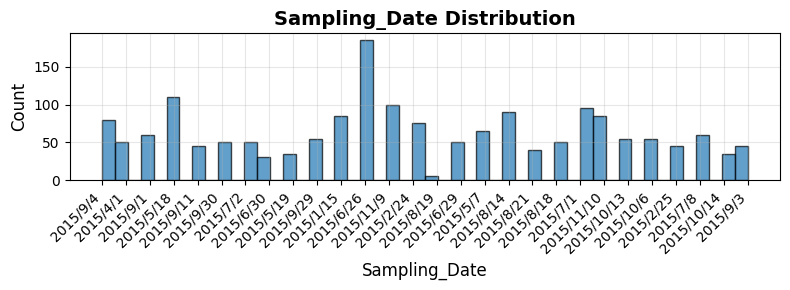

C:\Users\dennm\AppData\Local\Temp\ipykernel_23804\1481063379.py:12: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout() # Adjust layout to prevent overlap


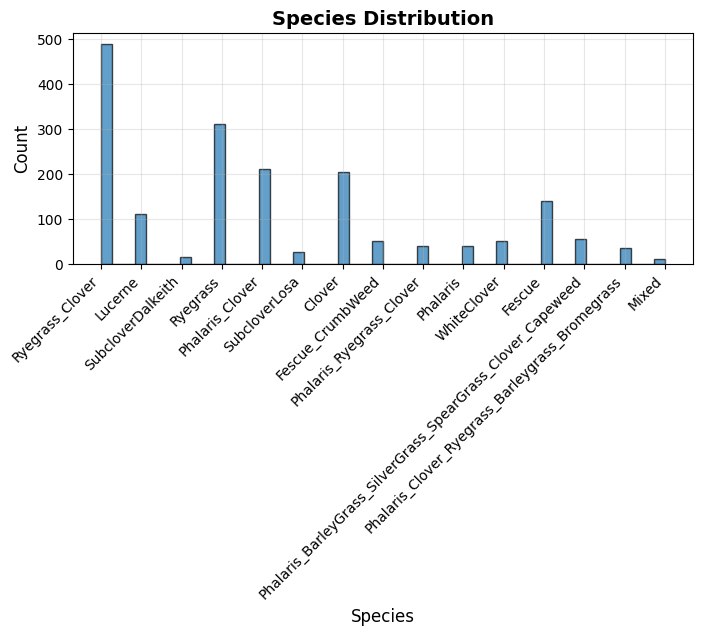

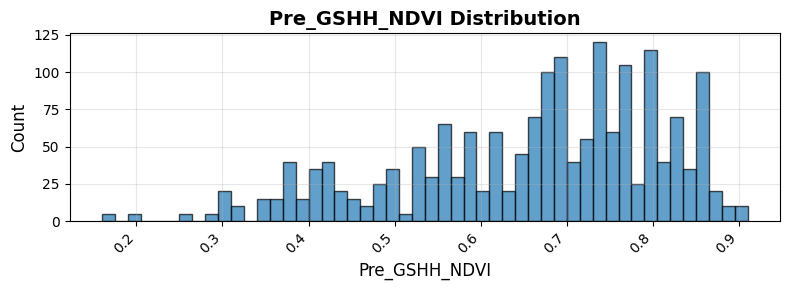

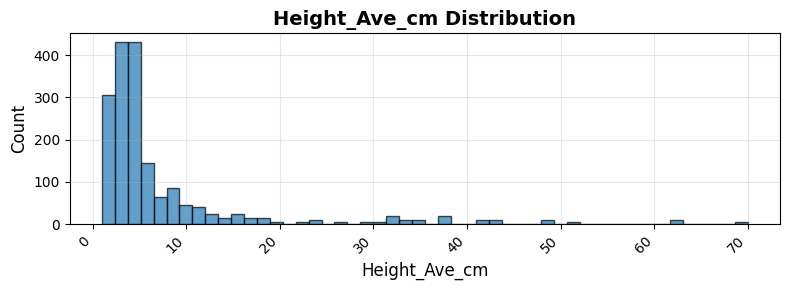

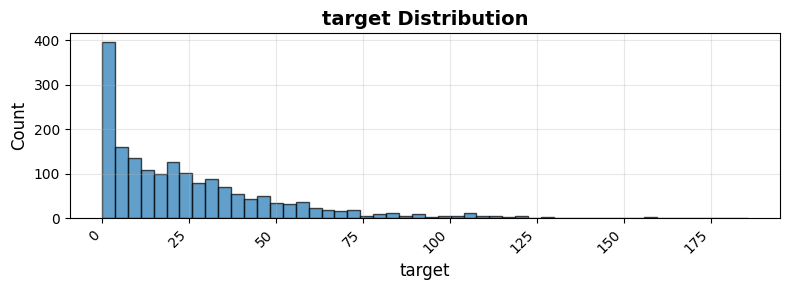

In [11]:
# Exclude non-numeric or identifier columns from histogram plotting
cols_to_plot = [col for col in TARGET_COLS if col not in ['sample_id', 'image_path', 'State', 'target_name']]

for col in cols_to_plot:
    plt.figure(figsize=(8, 3)) # Create a new figure for each histogram
    plt.hist(df[col].dropna(), bins=50, edgecolor='black', alpha=0.7)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title(f'{col} Distribution', fontsize=14, fontweight='bold')
    plt.grid(alpha=0.3)
    plt.xticks(rotation=45, ha="right") # Rotate x-axis labels
    plt.tight_layout() # Adjust layout to prevent overlap
    plt.show()

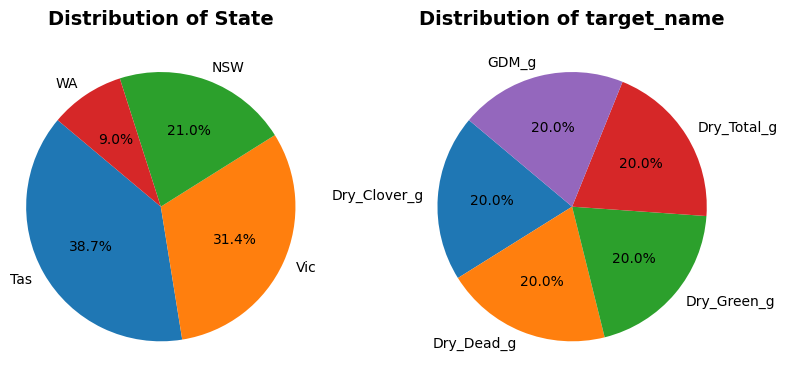

In [7]:
cols_to_plot = ['State', 'target_name']
n_rows, n_cols = 1, len(cols_to_plot)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))

# Ensure axes is an array even for a single subplot
axes = axes.flatten()

for ax, col in zip(axes, cols_to_plot):
    counts = df[col].value_counts()
    ax.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
    ax.set_title(f'Distribution of {col}', fontsize=14, fontweight='bold')
    ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.tight_layout()
plt.show()

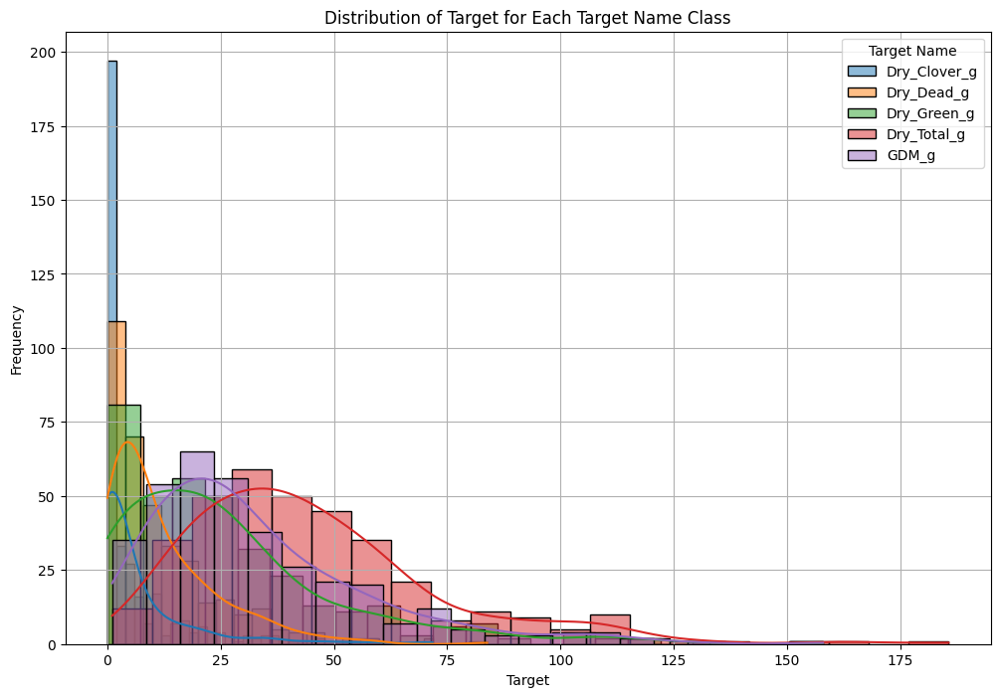

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

grouped_train_data = df.groupby('target_name')

plt.figure(figsize=(12, 8))
for target_name, group_data in grouped_train_data:
    sns.histplot(data=group_data, x='target', kde=True, label=target_name)

plt.title('Distribution of Target for Each Target Name Class')
plt.xlabel('Target')
plt.ylabel('Frequency')
plt.legend(title='Target Name')
plt.grid(True) # Added grid here
plt.show()

## Show sample images

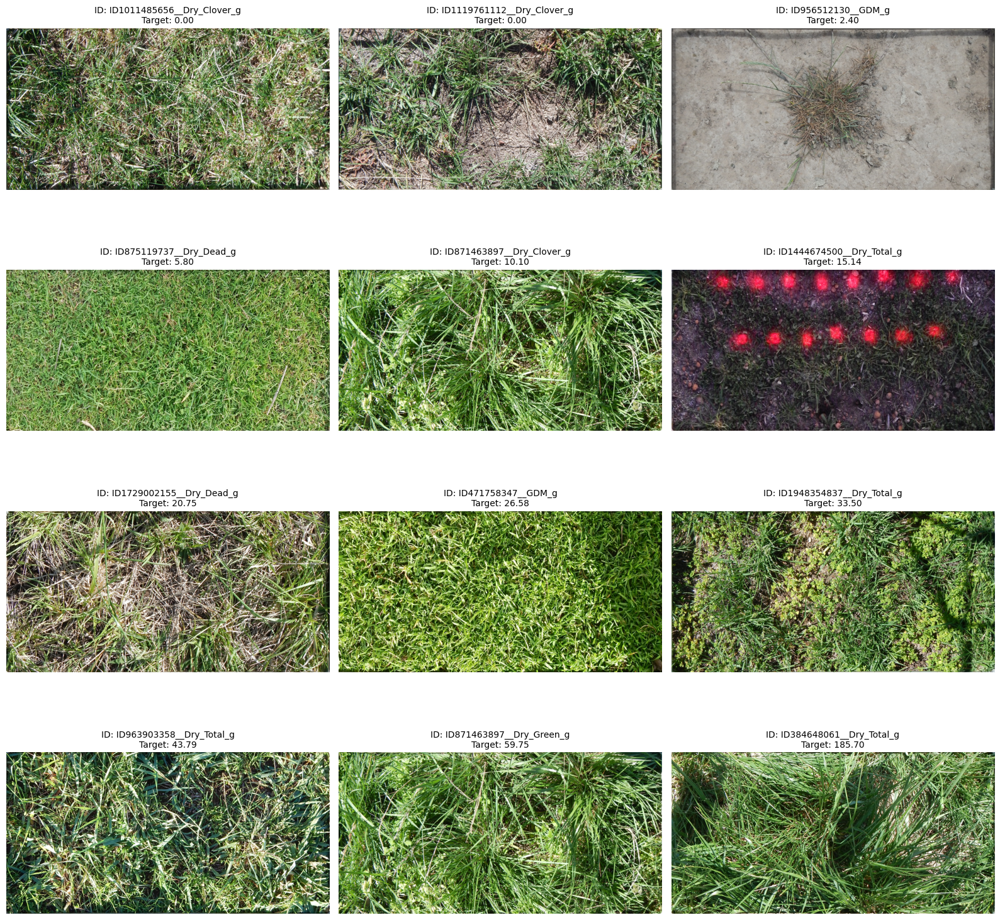

In [9]:
def show_images(df_sample, n=12, path_img=PATH_DATA):
    """Displays a linear sampling of images sorted by target value."""

    # Sort the DataFrame by the 'target' column
    df_sorted = df_sample.sort_values(by='target').reset_index(drop=True)

    # Perform linear sampling
    indices_to_show = np.linspace(0, len(df_sorted) - 1, n, dtype=int)
    df_to_show = df_sorted.iloc[indices_to_show]

    # Determine the number of rows and columns for subplots
    n_cols = 3  # You can adjust this number
    n_rows = (n + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
    axes = axes.flatten()

    # Remove unused subplots if any
    for i in range(n, len(axes)):
        fig.delaxes(axes[i])

    for i, (idx, row) in enumerate(df_to_show.iterrows()):
        # Use image_path directly (includes train/ID....jpg)
        img_path = os.path.join(path_img, row['image_path'])

        if os.path.exists(img_path):
            img = Image.open(img_path).convert('RGB')
            axes[i].imshow(img)
            # Include the target value in the title
            title = f"ID: {row['sample_id']}\nTarget: {row['target']:.2f}"
            axes[i].set_title(title, fontsize=10)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage: Show 12 images linearly sampled based on target value
show_images(df, n=12)

# Feature extraction

In [10]:
from transformers import pipeline

# Define the feature extraction pipeline
feature_extractor = pipeline(
    # model="facebook/dinov3-convnext-tiny-pretrain-lvd1689m",
    model="/kaggle/input/metadino-v3-convnext/pytorch/default/3/dinov3-convnext-tiny-pretrain-lvd1689m",
    task="image-feature-extraction",
    device=0 if torch.cuda.is_available() else -1 # Use GPU if available
)

def extract_image_features_pipeline(image_path, feature_extractor, path_data):
    """
    Splits an image into two 1000x1000 parts and extracts features from each using a pipeline.
    """
    full_image_path = os.path.join(path_data, image_path)
    img = Image.open(full_image_path)#.convert('RGB')

    # Split the image into two 1000x1000 parts
    width, height = img.size
    img1 = img.crop((0, 0, width // 2, height))
    img2 = img.crop((width // 2, 0, width, height))

    # The pipeline expects PIL Images or paths, use 'inputs'
    extracted_features = feature_extractor(inputs=[img1, img2], pool=True)
    # extracted_features = feature_extractor(inputs=[img], pool=True)
    # print(f"extracted_features: {np.array(extracted_features).shape}")

    # Concatenate features from both parts
    combined_features = list(np.array(extracted_features).flatten())
    # print(f"combined_features: {len(combined_features)}")

    return combined_features

print("Image feature extraction function defined using pipeline.")

2025-11-22 08:34:05.913126: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763800446.288196      13 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763800446.420936      13 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Device set to use cpu


Image feature extraction function defined using pipeline.


In [11]:
# Extract features for all images
image_features = {}
for index, row in tqdm(df.iterrows(), total=df.shape[0]):
    image_path = row['image_path']
    # Use the pipeline function
    features = extract_image_features_pipeline(image_path, feature_extractor, PATH_DATA)
    # Use the sample_id as the key for the features
    image_features[row['sample_id']] = features

print("Image feature extraction complete.")

  0%|          | 0/1785 [00:00<?, ?it/s]

Image feature extraction complete.


In [12]:
# Convert the image features dictionary to a DataFrame
image_features_df = pd.DataFrame.from_dict(image_features, orient='index')
image_features_df.index.name = 'sample_id'
image_features_df.columns = [f'img_feature_{i}' for i in range(image_features_df.shape[1])]

# One-hot encode the 'target_name' column
df_one_hot = pd.get_dummies(df['target_name'], prefix='target_name').astype(int) # Convert to int

# Merge the image features and one-hot encoded features with the original DataFrame
df_combined = df.merge(image_features_df, on='sample_id', how='left')
df_combined = df_combined.merge(df_one_hot, left_index=True, right_index=True)

print("Image features and one-hot encoded target names combined with the original DataFrame.")
display(df_combined.head())

Image features and one-hot encoded target names combined with the original DataFrame.


,sample_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,target_name,target,img_feature_0,...,img_feature_1531,img_feature_1532,img_feature_1533,img_feature_1534,img_feature_1535,target_name_Dry_Clover_g,target_name_Dry_Dead_g,target_name_Dry_Green_g,target_name_Dry_Total_g,target_name_GDM_g
0,ID1011485656__Dry_Clover_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Clover_g,0.0000,-0.770943,...,-2.216053,-0.544089,-0.191438,-0.721959,-1.209875,1,0,0,0,0
1,ID1011485656__Dry_Dead_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Dead_g,31.9984,-0.770943,...,-2.216053,-0.544089,-0.191438,-0.721959,-1.209875,0,1,0,0,0
2,ID1011485656__Dry_Green_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Green_g,16.2751,-0.770943,...,-2.216053,-0.544089,-0.191438,-0.721959,-1.209875,0,0,1,0,0
3,ID1011485656__Dry_Total_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,Dry_Total_g,48.2735,-0.770943,...,-2.216053,-0.544089,-0.191438,-0.721959,-1.209875,0,0,0,1,0
4,ID1011485656__GDM_g,train/ID1011485656.jpg,2015/9/4,Tas,Ryegrass_Clover,0.62,4.6667,GDM_g,16.2750,-0.770943,...,-2.216053,-0.544089,-0.191438,-0.721959,-1.209875,0,0,0,0,1


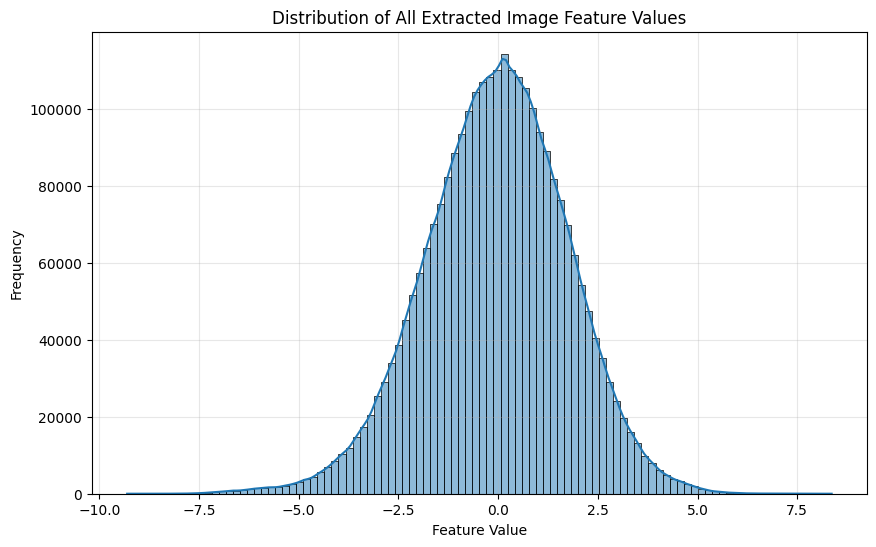

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Flatten all image features into a single Series
image_features_cols = [col for col in df_combined.columns if col.startswith("img_feature_")]
all_features_flat = image_features_df[image_features_cols].values.flatten()
all_features_series = pd.Series(all_features_flat)

# Plot a single histogram for all features
plt.figure(figsize=(10, 6))
sns.histplot(all_features_series, kde=True, bins=100) # Adjust bins as needed
plt.title('Distribution of All Extracted Image Feature Values')
plt.xlabel('Feature Value')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# Train Regressor

In [14]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Separate image features and other features
image_feature_cols = [col for col in df_combined.columns if col.startswith('img_feature_')]
other_features_cols = [col for col in df_combined.columns if col.startswith('target_name_')]

X_image_features = df_combined[image_feature_cols]
X_other_features = df_combined[other_features_cols]

# Standardize the image features before applying PCA
scaler = StandardScaler()
X_image_scaled = scaler.fit_transform(X_image_features)

# Apply PCA to reduce dimensionality
# You can adjust the number of components (n_components)
pca = PCA(n_components=75) # Example: Reduce components by 20x
X_image_pca = pca.fit_transform(X_image_scaled)

# Convert the PCA reduced features to a DataFrame
X_image_pca_df = pd.DataFrame(
    X_image_pca, index=df_combined.index,
    columns=[f'pca_img_feature_{i}' for i in range(pca.n_components)])

# Combine the PCA reduced image features with the other features
X_combined_pca = pd.concat([X_other_features, X_image_pca_df], axis=1)

print(f"Original number of image features: {X_image_features.shape[1]}")
print(f"Reduced number of image features after PCA: {X_image_pca_df.shape[1]}")
print(f"Total number of features for regression after PCA: {X_combined_pca.shape[1]}")

# Display the first few rows of the combined feature DataFrame after PCA
display(X_combined_pca.head())

Original number of image features: 1536
Reduced number of image features after PCA: 75
Total number of features for regression after PCA: 80


,target_name_Dry_Clover_g,target_name_Dry_Dead_g,target_name_Dry_Green_g,target_name_Dry_Total_g,target_name_GDM_g,pca_img_feature_0,pca_img_feature_1,pca_img_feature_2,pca_img_feature_3,pca_img_feature_4,...,pca_img_feature_65,pca_img_feature_66,pca_img_feature_67,pca_img_feature_68,pca_img_feature_69,pca_img_feature_70,pca_img_feature_71,pca_img_feature_72,pca_img_feature_73,pca_img_feature_74
0,1,0,0,0,0,-12.036552,7.150443,3.259135,4.546226,-4.242937,...,-0.298563,1.600588,-1.0679,0.060239,-0.244987,-0.235267,-0.330942,0.128726,0.571946,0.408286
1,0,1,0,0,0,-12.036552,7.150443,3.259135,4.546226,-4.242937,...,-0.298563,1.600588,-1.0679,0.060239,-0.244987,-0.235267,-0.330942,0.128726,0.571946,0.408286
2,0,0,1,0,0,-12.036552,7.150443,3.259135,4.546226,-4.242937,...,-0.298563,1.600588,-1.0679,0.060239,-0.244987,-0.235267,-0.330942,0.128726,0.571946,0.408286
3,0,0,0,1,0,-12.036552,7.150443,3.259135,4.546226,-4.242937,...,-0.298563,1.600588,-1.0679,0.060239,-0.244987,-0.235267,-0.330942,0.128726,0.571946,0.408286
4,0,0,0,0,1,-12.036552,7.150443,3.259135,4.546226,-4.242937,...,-0.298563,1.600588,-1.0679,0.060239,-0.244987,-0.235267,-0.330942,0.128726,0.571946,0.408286


In [15]:
import xgboost as xgb
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_squared_error
from scipy.stats import randint, uniform, loguniform
import numpy as np

# Define features (X) and target (y) using the PCA-reduced image features
# Exclude identifier columns and the original target column
# Use X_combined_pca which contains the one-hot encoded target_name and PCA image features
features = X_combined_pca.columns.tolist() # Use all columns from X_combined_pca
print(f"training features: {features}")
target = 'target'

X = X_combined_pca
y = df_combined[target] # Target remains the same

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the XGBoost Regressor
# The features include binary (from one-hot encoding) and float types.
# XGBoost can handle this mix of feature types effectively.

# Define a distribution for hyperparameters to sample from
# Using distributions allows for linear or log-uniform (experimental/exponential) sampling
param_dist = {
    'n_estimators': randint(100, 1000),
    'learning_rate': loguniform(0.001, 0.2),        # Log-uniform sampling
    'max_depth': randint(3, 11),
    'colsample_bytree': uniform(0.5, 0.5),          # Uniform sampling [0.5, 1.0]
    'reg_alpha': loguniform(1e-4, 10.0),            # Log-uniform sampling
    'reg_lambda': loguniform(1.0, 10.0)             # Log-uniform sampling
}

xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Use RandomizedSearchCV to find the best parameters
# n_iter controls the number of parameter settings that are sampled
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=1200,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
)

random_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_params = random_search.best_params_
xgb_model = random_search.best_estimator_

print("Randomized search complete.")
print(f"Best parameters found: {best_params}")
print("XGBoost model training complete with best parameters.")

training features: ['target_name_Dry_Clover_g', 'target_name_Dry_Dead_g', 'target_name_Dry_Green_g', 'target_name_Dry_Total_g', 'target_name_GDM_g', 'pca_img_feature_0', 'pca_img_feature_1', 'pca_img_feature_2', 'pca_img_feature_3', 'pca_img_feature_4', 'pca_img_feature_5', 'pca_img_feature_6', 'pca_img_feature_7', 'pca_img_feature_8', 'pca_img_feature_9', 'pca_img_feature_10', 'pca_img_feature_11', 'pca_img_feature_12', 'pca_img_feature_13', 'pca_img_feature_14', 'pca_img_feature_15', 'pca_img_feature_16', 'pca_img_feature_17', 'pca_img_feature_18', 'pca_img_feature_19', 'pca_img_feature_20', 'pca_img_feature_21', 'pca_img_feature_22', 'pca_img_feature_23', 'pca_img_feature_24', 'pca_img_feature_25', 'pca_img_feature_26', 'pca_img_feature_27', 'pca_img_feature_28', 'pca_img_feature_29', 'pca_img_feature_30', 'pca_img_feature_31', 'pca_img_feature_32', 'pca_img_feature_33', 'pca_img_feature_34', 'pca_img_feature_35', 'pca_img_feature_36', 'pca_img_feature_37', 'pca_img_feature_38', 'pc

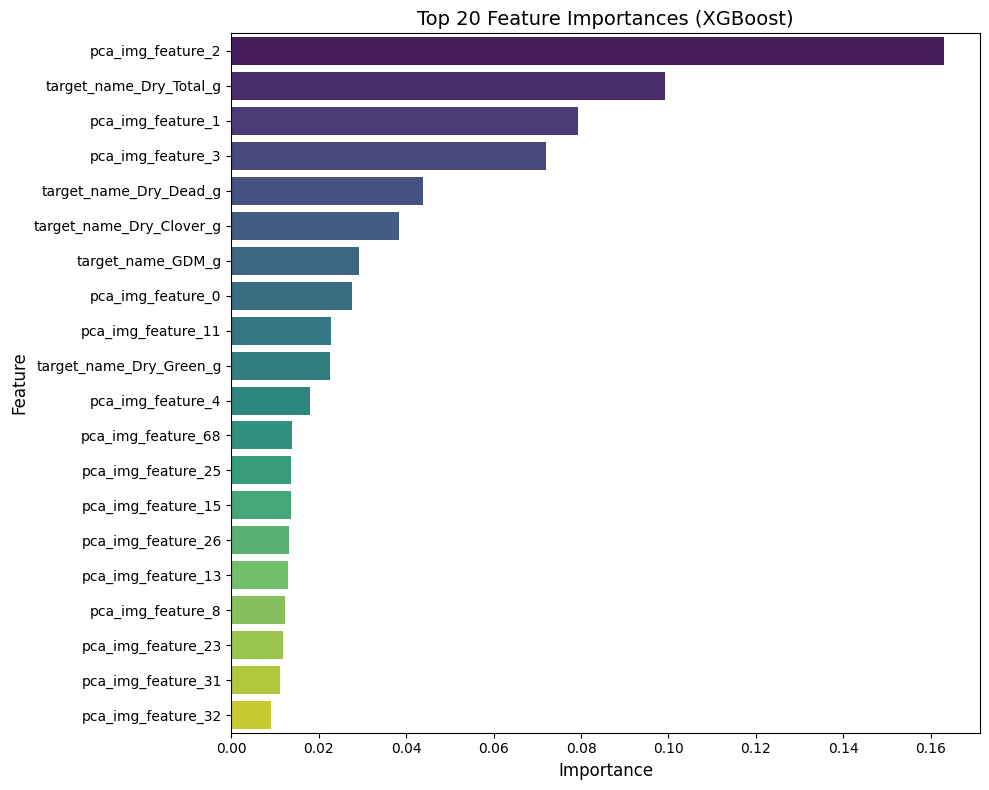

Sorted Feature Importances:


pca_img_feature_2          0.163141
target_name_Dry_Total_g    0.099331
pca_img_feature_1          0.079319
pca_img_feature_3          0.072028
target_name_Dry_Dead_g     0.043863
                             ...   
pca_img_feature_20         0.002205
pca_img_feature_39         0.002035
pca_img_feature_51         0.001780
pca_img_feature_44         0.001735
pca_img_feature_69         0.001267
Length: 80, dtype: float32

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importances from the best model found by GridSearchCV
# If you didn't use GridSearchCV, use xgb_model.feature_importances_
feature_importances = xgb_model.feature_importances_

# Create a pandas Series for easier handling and sorting
feature_importances_series = pd.Series(feature_importances, index=X_train.columns)

# Sort features by importance
sorted_feature_importances = feature_importances_series.sort_values(ascending=False)

# Plot the top N feature importances (e.g., top 20)
n_top_features = 20
plt.figure(figsize=(10, 8))
sns.barplot(x=sorted_feature_importances.head(n_top_features).values,
            y=sorted_feature_importances.head(n_top_features).index,
            palette='viridis')
plt.title(f'Top {n_top_features} Feature Importances (XGBoost)', fontsize=14)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.tight_layout()
plt.show()

# You can also display the sorted feature importances
print("Sorted Feature Importances:")
display(sorted_feature_importances)

In [17]:
# Make predictions on the test data
y_pred = xgb_model.predict(X_test)

print("Predictions on test data complete.")

Predictions on test data complete.


In [18]:
from sklearn.metrics import mean_absolute_error, r2_score

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"Root Mean Squared Error (RMSE) on the test set: {rmse}")

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error (MAE) on the test set: {mae}")

# Calculate R-squared
r2 = r2_score(y_test, y_pred)
print(f"R-squared on the test set: {r2}")

Root Mean Squared Error (RMSE) on the test set: 10.207539641834982
Mean Absolute Error (MAE) on the test set: 7.2519403391640065
R-squared on the test set: 0.8452423626046546


# Test predictions

In [19]:
# 1. Load test data
PATH_TEST_CSV = os.path.join(PATH_DATA, 'test.csv')
df_test = pd.read_csv(PATH_TEST_CSV)
print(f"Test Dataset size: {df_test.shape}")
display(df_test.head())

Test Dataset size: (5, 3)


,sample_id,image_path,target_name
0,ID1001187975__Dry_Clover_g,test/ID1001187975.jpg,Dry_Clover_g
1,ID1001187975__Dry_Dead_g,test/ID1001187975.jpg,Dry_Dead_g
2,ID1001187975__Dry_Green_g,test/ID1001187975.jpg,Dry_Green_g
3,ID1001187975__Dry_Total_g,test/ID1001187975.jpg,Dry_Total_g
4,ID1001187975__GDM_g,test/ID1001187975.jpg,GDM_g


In [20]:
# 2. Extract test image features
test_image_features = {}
for index, row in tqdm(df_test.iterrows(), total=df_test.shape[0]):
    image_path = row['image_path']
    # Use the pipeline function
    features = extract_image_features_pipeline(image_path, feature_extractor, PATH_DATA)
    # Use the sample_id as the key for the features
    test_image_features[row['sample_id']] = features

print("Test Image feature extraction complete.")

  0%|          | 0/5 [00:00<?, ?it/s]

Test Image feature extraction complete.


In [21]:
# 3. Combine test features
test_image_features_df = pd.DataFrame.from_dict(test_image_features, orient='index')
test_image_features_df.index.name = 'sample_id'
test_image_features_df.columns = [f'img_feature_{i}' for i in range(test_image_features_df.shape[1])]

# One-hot encode the 'target_name' column for the test set
test_df_one_hot = pd.get_dummies(df_test['target_name'], prefix='target_name').astype(int)

# Merge the test image features and one-hot encoded features with the original test DataFrame
df_test_combined = df_test.merge(test_image_features_df, on='sample_id', how='left')
df_test_combined = df_test_combined.merge(test_df_one_hot, left_index=True, right_index=True)

print("Test image features and one-hot encoded target names combined.")
display(df_test_combined.head())

Test image features and one-hot encoded target names combined.


,sample_id,image_path,target_name,img_feature_0,img_feature_1,img_feature_2,img_feature_3,img_feature_4,img_feature_5,img_feature_6,...,img_feature_1531,img_feature_1532,img_feature_1533,img_feature_1534,img_feature_1535,target_name_Dry_Clover_g,target_name_Dry_Dead_g,target_name_Dry_Green_g,target_name_Dry_Total_g,target_name_GDM_g
0,ID1001187975__Dry_Clover_g,test/ID1001187975.jpg,Dry_Clover_g,-0.959624,-1.488439,-1.463265,3.078731,1.026737,-1.834866,-2.296101,...,-2.145576,-0.407383,0.4955,-1.178155,-0.307609,1,0,0,0,0
1,ID1001187975__Dry_Dead_g,test/ID1001187975.jpg,Dry_Dead_g,-0.959624,-1.488439,-1.463265,3.078731,1.026737,-1.834866,-2.296101,...,-2.145576,-0.407383,0.4955,-1.178155,-0.307609,0,1,0,0,0
2,ID1001187975__Dry_Green_g,test/ID1001187975.jpg,Dry_Green_g,-0.959624,-1.488439,-1.463265,3.078731,1.026737,-1.834866,-2.296101,...,-2.145576,-0.407383,0.4955,-1.178155,-0.307609,0,0,1,0,0
3,ID1001187975__Dry_Total_g,test/ID1001187975.jpg,Dry_Total_g,-0.959624,-1.488439,-1.463265,3.078731,1.026737,-1.834866,-2.296101,...,-2.145576,-0.407383,0.4955,-1.178155,-0.307609,0,0,0,1,0
4,ID1001187975__GDM_g,test/ID1001187975.jpg,GDM_g,-0.959624,-1.488439,-1.463265,3.078731,1.026737,-1.834866,-2.296101,...,-2.145576,-0.407383,0.4955,-1.178155,-0.307609,0,0,0,0,1


In [22]:
# 4. Scale and PCA transform test image features
# Separate image features and other features for the test set
test_image_feature_cols = [col for col in df_test_combined.columns if col.startswith('img_feature_')]
test_other_features_cols = [col for col in df_test_combined.columns if col.startswith('target_name_')]

X_test_image_features = df_test_combined[test_image_feature_cols]
X_test_other_features = df_test_combined[test_other_features_cols]

# Apply the *trained* scaler and PCA to the test image features
X_test_image_scaled = scaler.transform(X_test_image_features) # Use the fitted scaler
X_test_image_pca = pca.transform(X_test_image_scaled)       # Use the fitted pca

# Convert the PCA reduced features to a DataFrame
X_test_image_pca_df = pd.DataFrame(
    X_test_image_pca, index=df_test_combined.index,
    columns=[f'pca_img_feature_{i}' for i in range(pca.n_components)])

print(f"Scaled and PCA-transformed test image features shape: {X_test_image_pca_df.shape}")

# Display the first few rows of the PCA reduced test image features
display(X_test_image_pca_df.head())

Scaled and PCA-transformed test image features shape: (5, 75)


,pca_img_feature_0,pca_img_feature_1,pca_img_feature_2,pca_img_feature_3,pca_img_feature_4,pca_img_feature_5,pca_img_feature_6,pca_img_feature_7,pca_img_feature_8,pca_img_feature_9,...,pca_img_feature_65,pca_img_feature_66,pca_img_feature_67,pca_img_feature_68,pca_img_feature_69,pca_img_feature_70,pca_img_feature_71,pca_img_feature_72,pca_img_feature_73,pca_img_feature_74
0,-6.247917,14.884924,9.832457,6.995168,-6.881185,3.159283,-2.380385,-3.215719,-3.644786,-3.616142,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
1,-6.247917,14.884924,9.832457,6.995168,-6.881185,3.159283,-2.380385,-3.215719,-3.644786,-3.616142,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
2,-6.247917,14.884924,9.832457,6.995168,-6.881185,3.159283,-2.380385,-3.215719,-3.644786,-3.616142,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
3,-6.247917,14.884924,9.832457,6.995168,-6.881185,3.159283,-2.380385,-3.215719,-3.644786,-3.616142,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
4,-6.247917,14.884924,9.832457,6.995168,-6.881185,3.159283,-2.380385,-3.215719,-3.644786,-3.616142,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828


In [23]:
# 5. Prepare test data for inference
# Combine the PCA reduced image features with the other features (one-hot encoded target_name)
X_test_final = pd.concat([X_test_other_features, X_test_image_pca_df], axis=1)

print(f"Final test feature DataFrame shape: {X_test_final.shape}")

# Display the first few rows of the final test feature DataFrame
display(X_test_final.head())

Final test feature DataFrame shape: (5, 80)


,target_name_Dry_Clover_g,target_name_Dry_Dead_g,target_name_Dry_Green_g,target_name_Dry_Total_g,target_name_GDM_g,pca_img_feature_0,pca_img_feature_1,pca_img_feature_2,pca_img_feature_3,pca_img_feature_4,...,pca_img_feature_65,pca_img_feature_66,pca_img_feature_67,pca_img_feature_68,pca_img_feature_69,pca_img_feature_70,pca_img_feature_71,pca_img_feature_72,pca_img_feature_73,pca_img_feature_74
0,1,0,0,0,0,-6.247917,14.884924,9.832457,6.995168,-6.881185,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
1,0,1,0,0,0,-6.247917,14.884924,9.832457,6.995168,-6.881185,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
2,0,0,1,0,0,-6.247917,14.884924,9.832457,6.995168,-6.881185,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
3,0,0,0,1,0,-6.247917,14.884924,9.832457,6.995168,-6.881185,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828
4,0,0,0,0,1,-6.247917,14.884924,9.832457,6.995168,-6.881185,...,0.747875,1.552721,0.314025,-0.275998,-2.232715,1.923957,-0.544627,3.152428,0.057404,-1.266828


In [24]:
# 6. Make predictions
test_predictions = xgb_model.predict(X_test_final)

print("Predictions on test data complete.")
display(test_predictions)

Predictions on test data complete.


array([ 4.419419, 22.613022, 27.07088 , 59.530113, 27.377287],
      dtype=float32)

# Prepare submission

In [25]:
# 7. Generate submission file
submission_df = pd.DataFrame({'sample_id': df_test['sample_id'], 'target': test_predictions})

# Ensure predictions are non-negative if the target represents a physical quantity
submission_df['target'] = submission_df['target'].clip(lower=0)

submission_path = 'submission.csv'
submission_df.to_csv(submission_path, index=False)

print(f"Submission file generated at: {submission_path}")
display(submission_df.head())

Submission file generated at: submission.csv


,sample_id,target
0,ID1001187975__Dry_Clover_g,4.419419
1,ID1001187975__Dry_Dead_g,22.613022
2,ID1001187975__Dry_Green_g,27.070881
3,ID1001187975__Dry_Total_g,59.530113
4,ID1001187975__GDM_g,27.377287


In [26]:
!head submission.csv

sample_id,target
ID1001187975__Dry_Clover_g,4.419419
ID1001187975__Dry_Dead_g,22.613022
ID1001187975__Dry_Green_g,27.07088
ID1001187975__Dry_Total_g,59.530113
ID1001187975__GDM_g,27.377287
